In [64]:
%run ../common-imports.ipynb

# Dataset `classifier-1`

Simple classifier dataset will attempt to model it with logistic regression classifier and linear discriminant analysis.

**GOAL**
* Understand the appropriate workflow for classification tasks
* Understand the workings of the logistic regression classifier
* Also, understand the working of linear discriminant analysis

## Exploratory data analysis

We will follow our well-trodden path of systematically load the data, explore and visualize it.

### Load data and observe its statistics

In [65]:
data = pd.read_csv ("../../datasets/classifier-1.csv")
data = data.dropna()
data.describe(include='all').transpose() #.style.set_table_styles(sv_table_styles())

,count,mean,std,min,25%,50%,75%,max
x1,3000.0,-0.115546,6.004582,-13.153,-5.28700,0.0215,4.90475,13.339
x2,3000.0,0.035955,6.030188,-13.651,-5.05525,0.0780,5.04300,14.171
t,3000.0,0.562667,0.496140,0.000,0.00000,1.0000,1.00000,1.000


In [66]:
#data.t = data.t.astype('category')

### Visualizations

Let us now plot the data, and observe some of its key qualities.

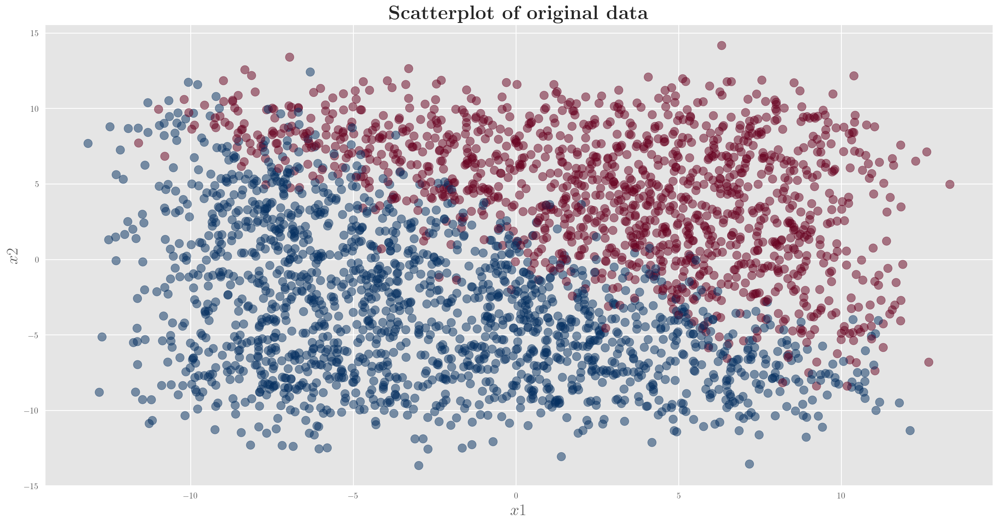

In [67]:
plt.scatter(data['x1'],   # as the x-axis 
            data['x2'],   # as the y-axis
            s=100,
            alpha=0.5, # size
            c=data['t'],
             cmap="RdBu")
plt.xlabel (r"$x1$")
plt.ylabel(r"$x2$")
plt.title(r'\textbf{Scatterplot of original data}')
plt.show ()

The scatterplot above leads us to believe that one may reasonably consider a linear decision boundary, and thus a linear classifier to model this data.

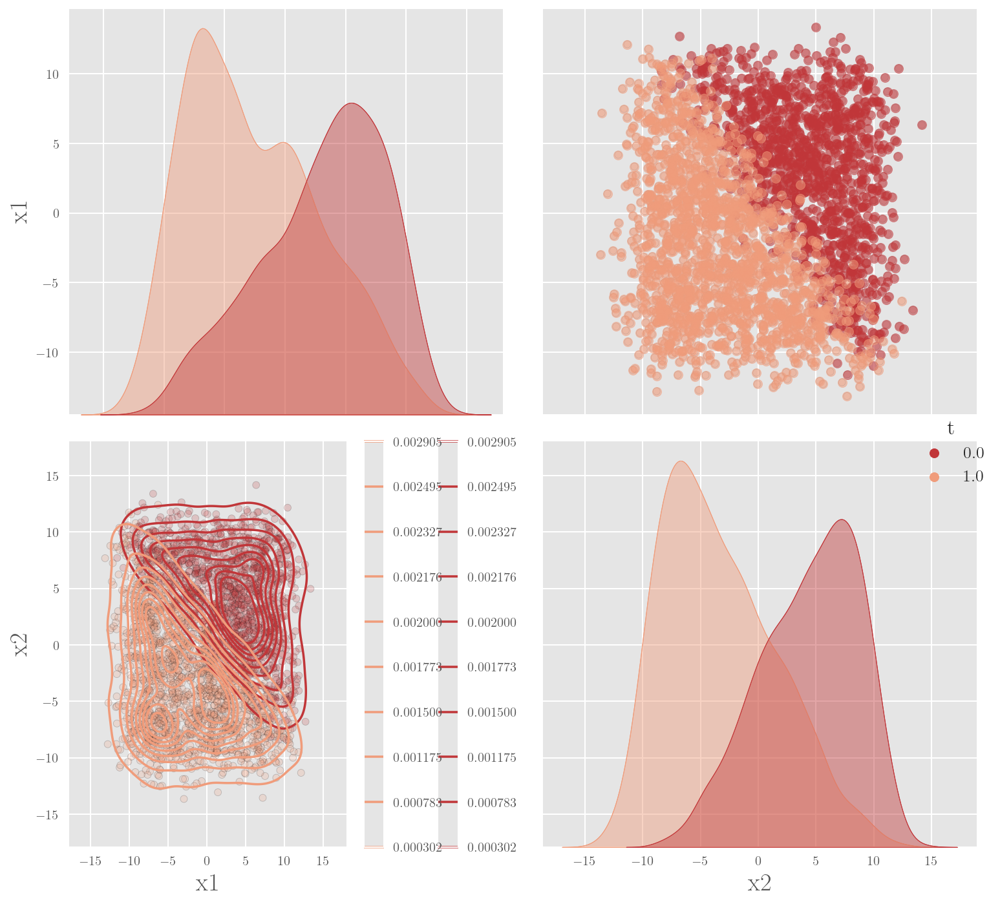

In [68]:
sns.set_palette("RdBu")

sample = data
g = sns.pairplot(sample, diag_kind='kde', 
                   plot_kws = { 'alpha': 0.20, 's': 30, 'edgecolor': 'k',  }, 
                   size=5, hue='t');
g.map_diag(sns.kdeplot,shade=True);
g.map_upper(plt.scatter,   alpha=0.5);
g.map_lower(sns.kdeplot, shade=False, shade_lowest=False, cbar=True);

plt.tight_layout()

Separate out the predictors from the response, and split the data into the training and test subsets.

In [69]:
X, y = data[['x1', 'x2']], data['t']
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

## Logistic Regression Classifier

Let us now attempt to model this data with a logistic regression classifier,on the hypothesis that it may be a linear dataset.

In [70]:
classifier = LogisticRegression(solver='newton-cg')
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)

### Model diagnostics

In [71]:
confusion_matrix_ = confusion_matrix(y_test, y_pred)
print(confusion_matrix_)

[[295  25]
 [ 26 404]]


In [72]:

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.92      0.92      0.92       320
         1.0       0.94      0.94      0.94       430

    accuracy                           0.93       750
   macro avg       0.93      0.93      0.93       750
weighted avg       0.93      0.93      0.93       750



In [73]:
print("{:15}: {} ".format('Classes',classifier.classes_))
print('{:15}: {} '.format('Coefficients',classifier.coef_))
print('{:15}: {} '.format('Intercept', classifier.intercept_))


Classes        : [0. 1.] 
Coefficients   : [[-0.74396794 -0.91310206]] 
Intercept      : [1.21062263] 


### Class Probabilities

In the `sklearn` library, the class probabilities can be seen using the `.predict_proba(X)` method. It returns an array whose rows are the predictions for each row of `X`, and the columns are the class probabilities. In the clase of binary classifier, it is enough to retrieve the proabilities of one of the classes, since the other will be the complement of it.

In [74]:
predictions = classifier.predict_proba(X)[:, 1].reshape(y.shape)
predictions

array([2.34167284e-04, 1.37710465e-06, 9.93500783e-01, ...,
       1.05934733e-04, 1.97930810e-01, 9.99548718e-01])

The `yellowbrick` library provides a succient visualization of the model metrics.

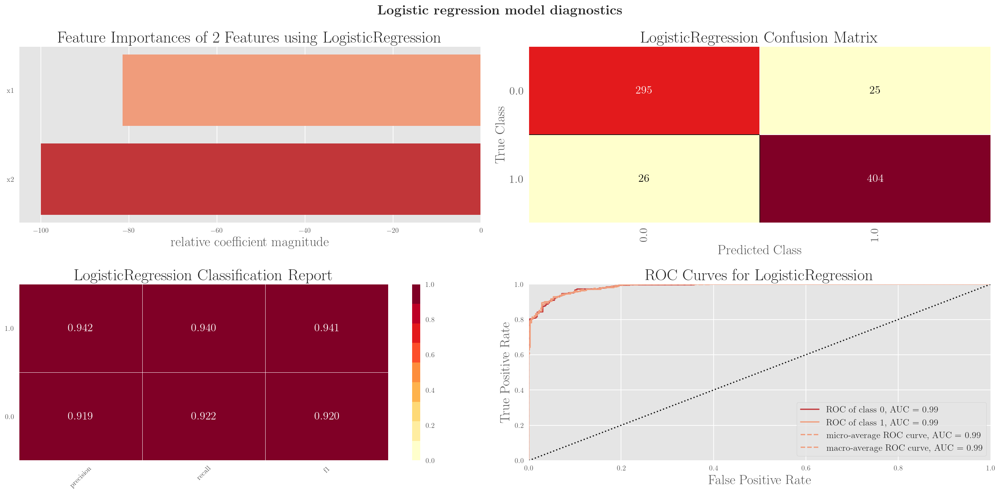

In [75]:

fig, axes = plt.subplots(2, 2)

model = classifier
visualgrid = [
    FeatureImportances(model, ax=axes[0][0]),
    ConfusionMatrix(model, ax=axes[0][1]),
    ClassificationReport(model, ax=axes[1][0]),
    ROCAUC(model, classes = ['0', '1'], ax=axes[1][1]),
]

for viz in visualgrid:
    viz.fit(X_train, y_train)
    viz.score(X_test, y_test, )
    viz.finalize()

plt.suptitle(r'\textbf{Logistic regression model diagnostics}');
plt.tight_layout();

The model diagnostics appear to be encouraging. Let us now visualize the model's predictions, and its decision boundary that splits the feature space.

### Visual model predictions

Text(0.5, 1.0, '\\textbf{Scatterplot of original data, along with their predicted class probabilities}')

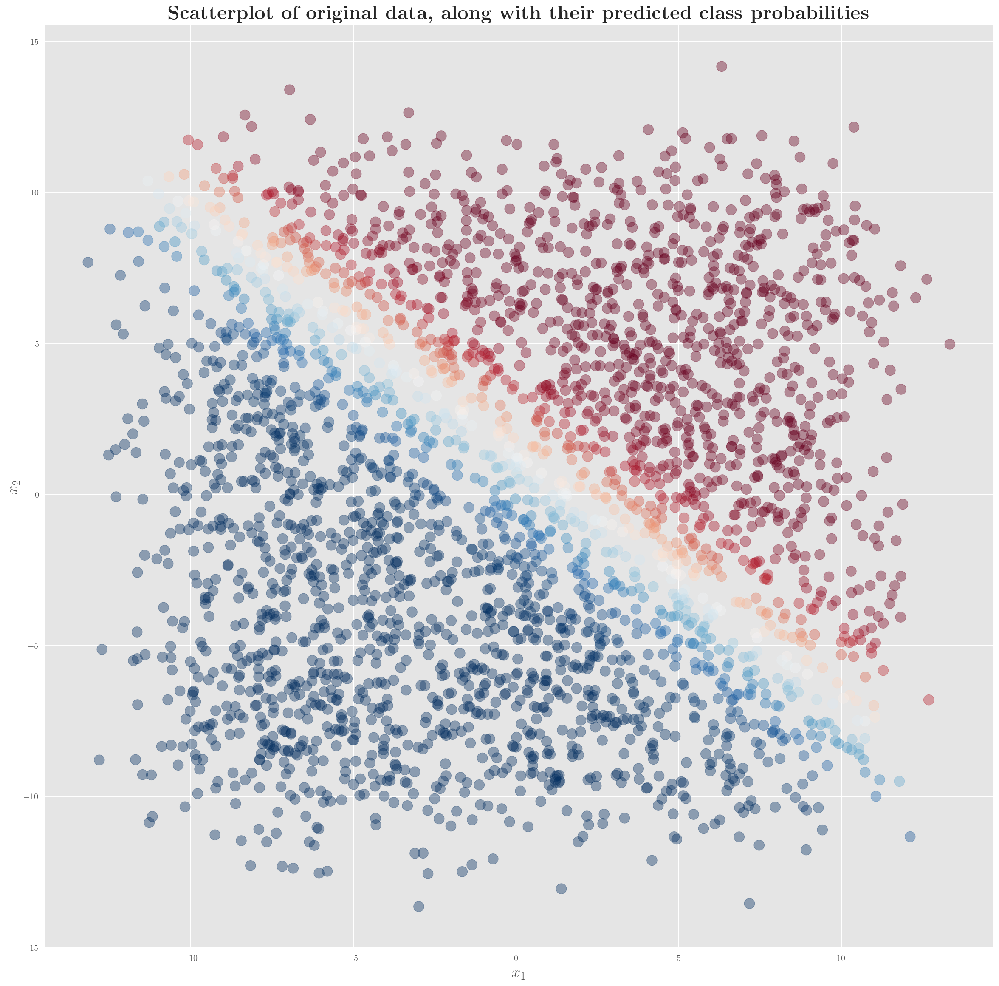

In [76]:
plt.figure(figsize=(20,20))
plt.scatter(X['x1'],   # as the x-axis 
            X['x2'],   # as the y-axis
            s=150,
            alpha=0.4, # size
            c=predictions,
            cmap='RdBu',
            
           )
plt.xlabel (r"$x_1$")
plt.ylabel(r"$x_2$")
plt.title(r'\textbf{Scatterplot of original data, along with their predicted class probabilities}')


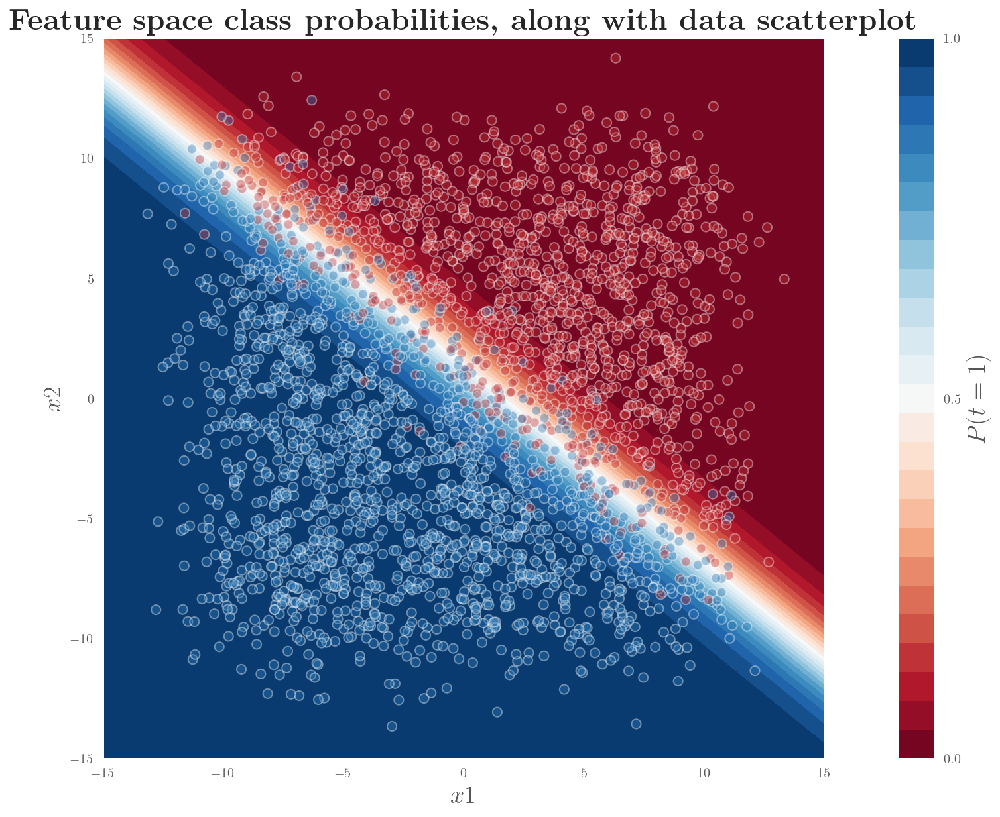

In [77]:

sample_x, sample_y = np.mgrid[-15:15:.01, -15:15:.01]
grid = np.c_[sample_x.ravel(), sample_y.ravel()]

probs = classifier.predict_proba(grid)[:, 1].reshape(sample_x.shape)

# Now let us draw the decision-boundary
figure, axes = plt.subplots(figsize=(20,10));
contour = axes.contourf (sample_x, 
                         sample_y, 
                         probs, 
                         25, 
                         cmap="RdBu",
                         vmin=0,
                         vmax=1);
axes_color = figure.colorbar(contour)
axes_color.set_label("$P(t=1)$")
axes_color.set_ticks ([0.0, 0.5, 1.0])


# Draw the scatterplot
axes.scatter(X['x1'], 
             X['x2'], 
             c=y, 
             s=50, 
             cmap="RdBu", 
             vmin=-0.2, 
             vmax=1.2, 
             edgecolor="white", 
             linewidth=1,
             alpha=0.4);

#Labels, etc.
axes.set(aspect="equal", 
         xlim=(-15,15),
         ylim=(-15,15),
         xlabel=r'$x1$',
         ylabel=r'$x2$'
        );

plt.title(r'\textbf{Feature space class probabilities, along with data scatterplot}');



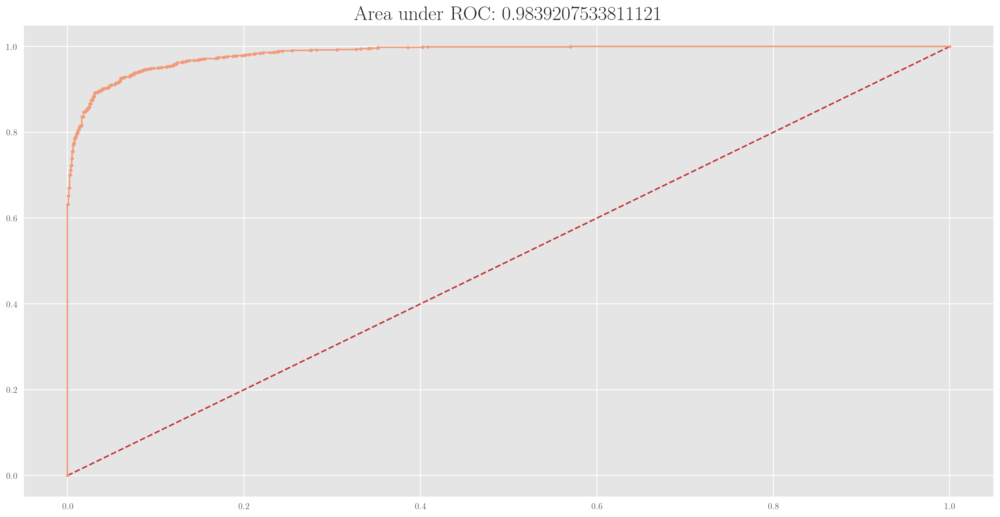

In [78]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
fpr, tpr, thresholds = roc_curve(y, predictions)
auROC = roc_auc_score(y, predictions)
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.title("Area under ROC: {}".format(auROC))
plt.show()

#### Simply drawing the decision-boundary over the points

In [79]:
# In the notation of our text-book:
#
xx    = np.arange(-15,15, 0.1)
beta0 = classifier.intercept_
beta1 = classifier.coef_[0][0]
beta2 = classifier.coef_[0][1]
#
# Decision-Boundary: beta0 + beta1*x + beta2*y = 0
#
line_intercept = -beta0/beta2
line_slope     = -beta1/beta2
print ("intercept: %s, slope %s" % (line_intercept, line_slope))

#
# Equation of line, on
#
yy = line_intercept + line_slope*xx

intercept: [1.32583496], slope -0.8147697589580917


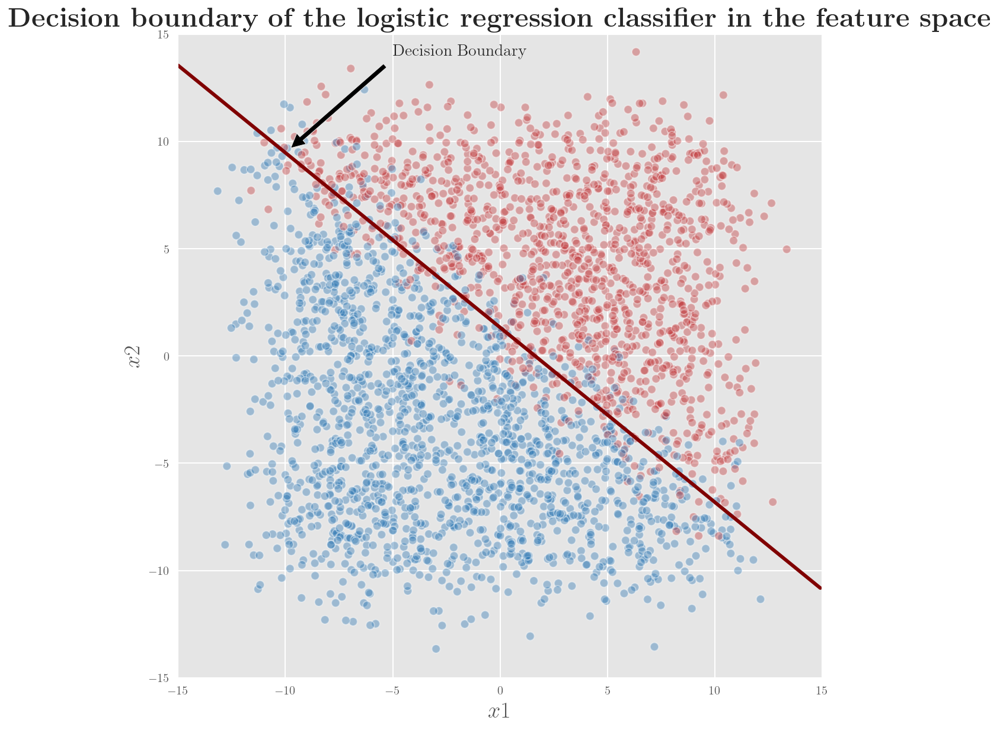

In [80]:
figure, axes = plt.subplots(figsize=(20,10))


# Draw the scatterplot
axes.scatter(data.x1, 
             data.x2, 
             c=data.t, 
             s=50, 
             cmap="RdBu", 
             vmin=-0.2, 
             vmax=1.2, 
             edgecolor="white", 
             linewidth=1,
             alpha=0.4);

axes.plot(xx, yy, lw=3, color="maroon");
axes.annotate('Decision Boundary', 
              xy=(xx[50], yy[50]),
              xytext=(-5, 14),
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=14,
             fontweight='bold',);

#Labels, etc.
axes.set(aspect="equal", 
         xlim=(-15,15),
         ylim=(-15,15),
         xlabel="$x1$",
         ylabel="$x2$"
        );
axes.set_title(r'\textbf{Decision boundary of the logistic regression classifier in the feature space}');


# Linear Discriminant Analysis

In [81]:
lda = LinearDiscriminantAnalysis()
lda.fit(X_train, y_train)
y_pred = lda.predict(X_test)

### Model diagnostics

In [82]:
confusion_matrix_ = confusion_matrix(y_test, y_pred)
print(confusion_matrix_)

[[301  19]
 [ 25 405]]


In [83]:

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.92      0.94      0.93       320
         1.0       0.96      0.94      0.95       430

    accuracy                           0.94       750
   macro avg       0.94      0.94      0.94       750
weighted avg       0.94      0.94      0.94       750



In [84]:
print("{:15}: {} ".format('Classes',lda.classes_))
print('{:15}: {} '.format('Coefficients',lda.coef_))
print('{:15}: {} '.format('Intercept', lda.intercept_))


Classes        : [0. 1.] 
Coefficients   : [[-0.4275994  -0.56453194]] 
Intercept      : [0.65267773] 


### Class Probabilities

In the `sklearn` library, the class probabilities can be seen using the `.predict_proba(X)` method. It returns an array whose rows are the predictions for each row of `X`, and the columns are the class probabilities. In the clase of binary classifier, it is enough to retrieve the proabilities of one of the classes, since the other will be the complement of it.

In [85]:
predictions = lda.predict_proba(X)[:, 1].reshape(y.shape)
yhat=lda.predict(X_test)

The `yellowbrick` library provides a succient visualization of the model metrics.

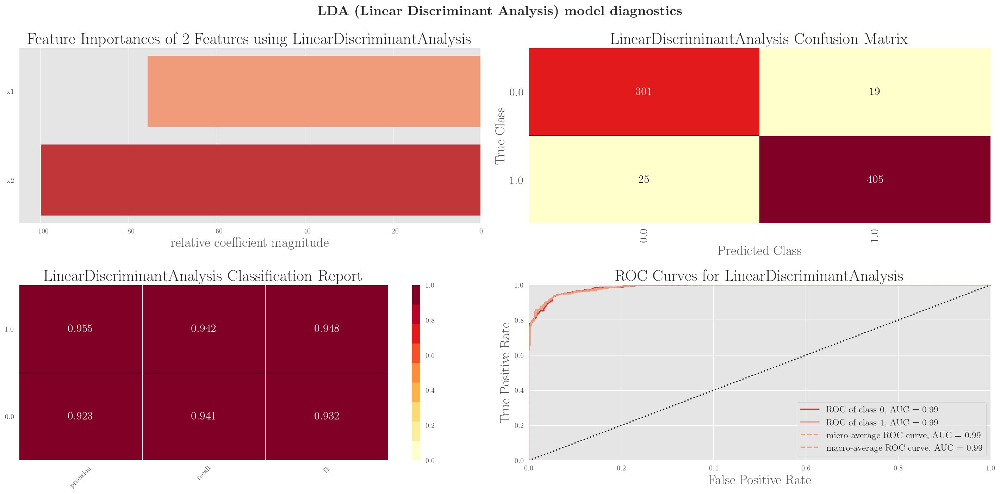

In [86]:

fig, axes = plt.subplots(2, 2)

model = lda
visualgrid = [
    FeatureImportances(model, ax=axes[0][0]),
    ConfusionMatrix(model, ax=axes[0][1]),
    ClassificationReport(model, ax=axes[1][0]),
    ROCAUC(model, classes = ['0', '1'], ax=axes[1][1]),
]

for viz in visualgrid:
    viz.fit(X_train, y_train)
    viz.score(X_test, y_test, )
    viz.finalize()

plt.suptitle(r'\textbf{LDA (Linear Discriminant Analysis) model diagnostics}');
plt.tight_layout();

### Visual model predictions

Text(0.5, 1.0, '\\textbf{Scatterplot of original data, along with their predicted class probabilities}')

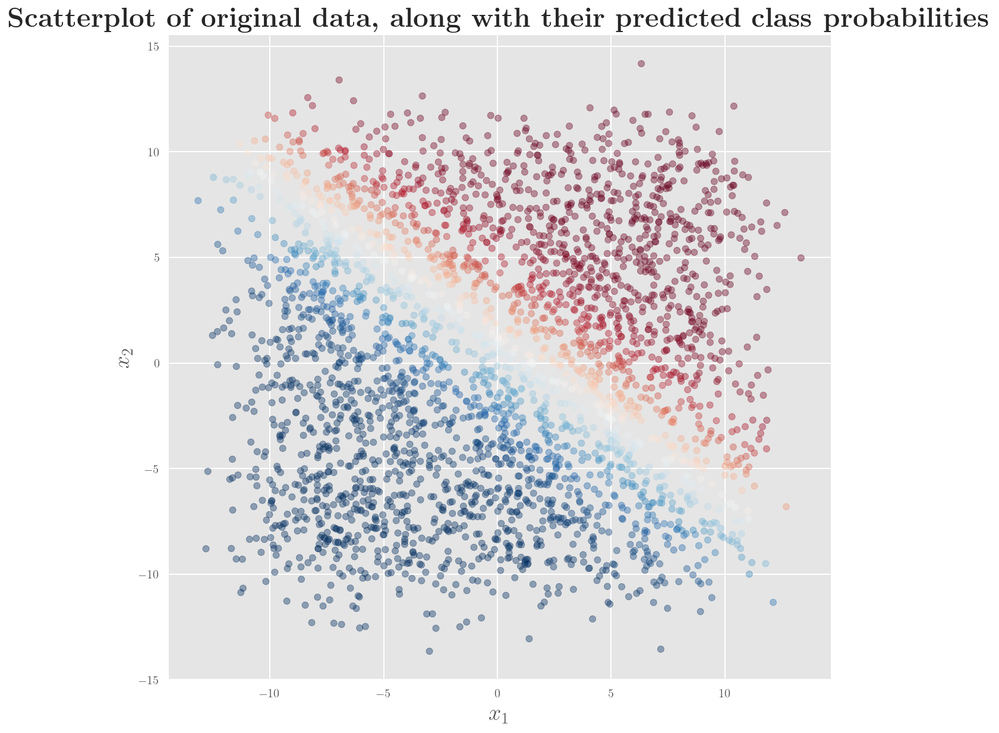

In [87]:
plt.figure(figsize=(10,10))
plt.scatter(X['x1'],   # as the x-axis 
            X['x2'],   # as the y-axis
            s=30,
            alpha=0.4, # size
            c=predictions,
            cmap='RdBu',
            
           )
plt.xlabel (r"$x_1$")
plt.ylabel(r"$x_2$")
plt.title(r'\textbf{Scatterplot of original data, along with their predicted class probabilities}')


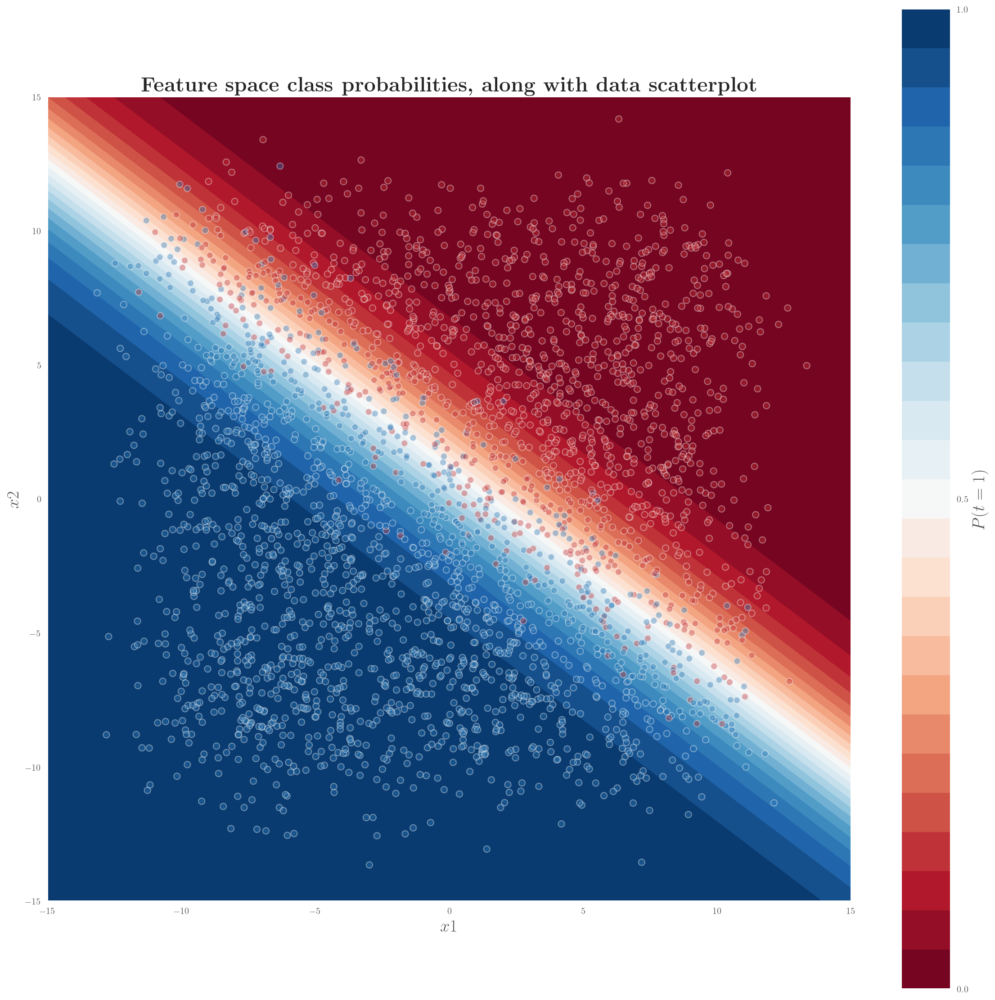

In [88]:

sample_x, sample_y = np.mgrid[-15:15:.01, -15:15:.01]
grid = np.c_[sample_x.ravel(), sample_y.ravel()]

probs = lda.predict_proba(grid)[:, 1].reshape(sample_x.shape)

# Now let us draw the decision-boundary
figure, axes = plt.subplots(figsize=(20,20));
contour = axes.contourf (sample_x, 
                         sample_y, 
                         probs, 
                         25, 
                         cmap="RdBu",
                         vmin=0,
                         vmax=1);
axes_color = figure.colorbar(contour)
axes_color.set_label("$P(t=1)$")
axes_color.set_ticks ([0.0, 0.5, 1.0])


# Draw the scatterplot
axes.scatter(X['x1'], 
             X['x2'], 
             c=y, 
             s=50, 
             cmap="RdBu", 
             vmin=-0.2, 
             vmax=1.2, 
             edgecolor="white", 
             linewidth=1,
             alpha=0.4);

#Labels, etc.
axes.set(aspect="equal", 
         xlim=(-15,15),
         ylim=(-15,15),
         xlabel=r'$x1$',
         ylabel=r'$x2$'
        );

plt.title(r'\textbf{Feature space class probabilities, along with data scatterplot}');



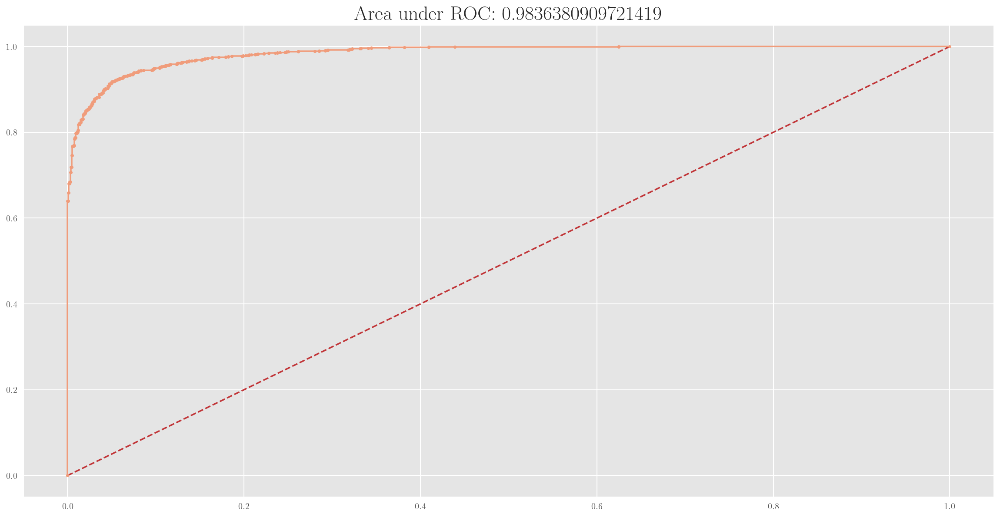

In [89]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
fpr, tpr, thresholds = roc_curve(y, predictions)
auROC = roc_auc_score(y, predictions)
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.title("Area under ROC: {}".format(auROC))
plt.show()

#### Simply drawing the decision-boundary over the points

In [90]:
# In the notation of our text-book:
#
xx    = np.arange(-15,15, 0.1)
beta0 = lda.intercept_
beta1 = lda.coef_[0][0]
beta2 = lda.coef_[0][1]
#
# Decision-Boundary: beta0 + beta1*x + beta2*y = 0
#
line_intercept = -beta0/beta2
line_slope     = -beta1/beta2
print ("intercept: %s, slope %s" % (line_intercept, line_slope))

#
# Equation of line, on
#
yy = line_intercept + line_slope*xx

intercept: [1.15613959], slope -0.757440567779367


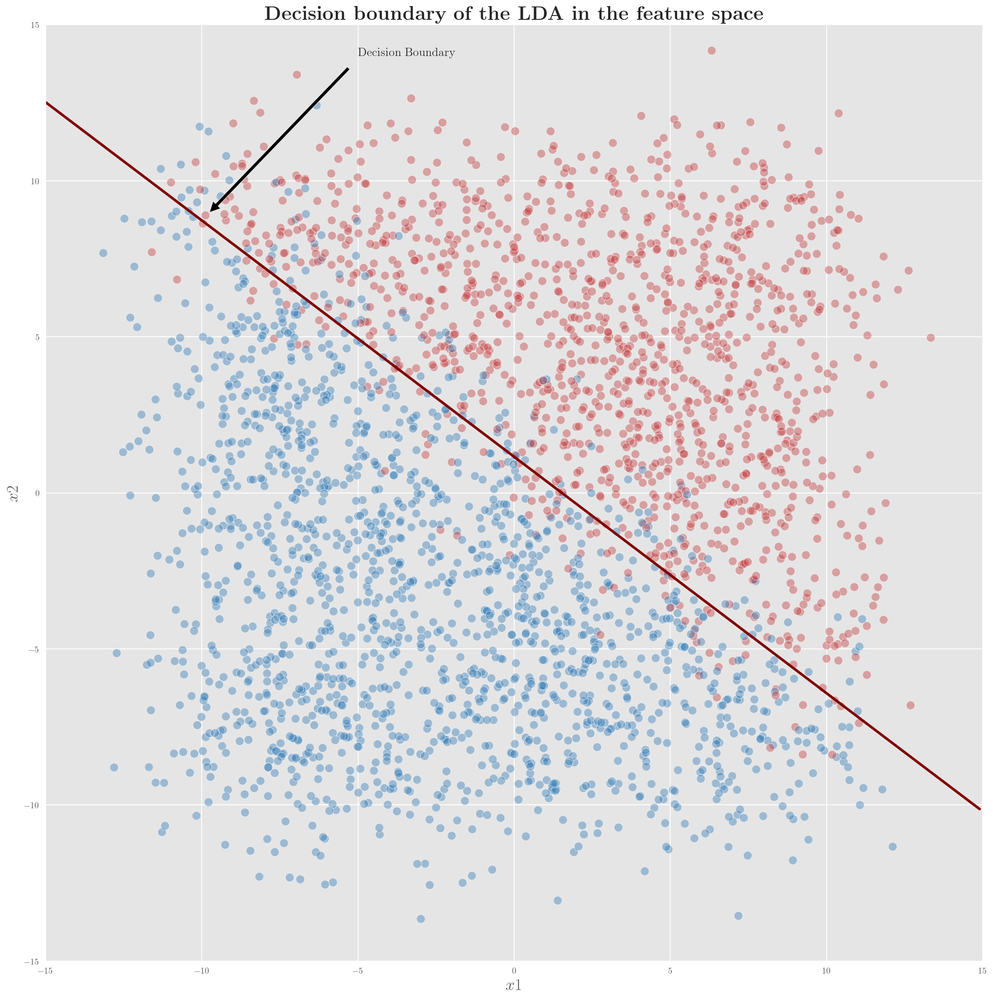

In [91]:
figure, axes = plt.subplots(figsize=(20,20))


# Draw the scatterplot
axes.scatter(data.x1, 
             data.x2, 
             c=data.t, 
             s=100, 
             cmap="RdBu", 
             vmin=-0.2, 
             vmax=1.2, 
             edgecolor="white", 
             linewidth=1,
             alpha=0.4);

axes.plot(xx, yy, lw=3, color="maroon");
axes.annotate('Decision Boundary', 
              xy=(xx[50], yy[50]),
              xytext=(-5, 14),
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=14,
             fontweight='bold',);

#Labels, etc.
axes.set(aspect="equal", 
         xlim=(-15,15),
         ylim=(-15,15),
         xlabel="$x1$",
         ylabel="$x2$"
        );
axes.set_title(r'\textbf{Decision boundary of the LDA in the feature space}');


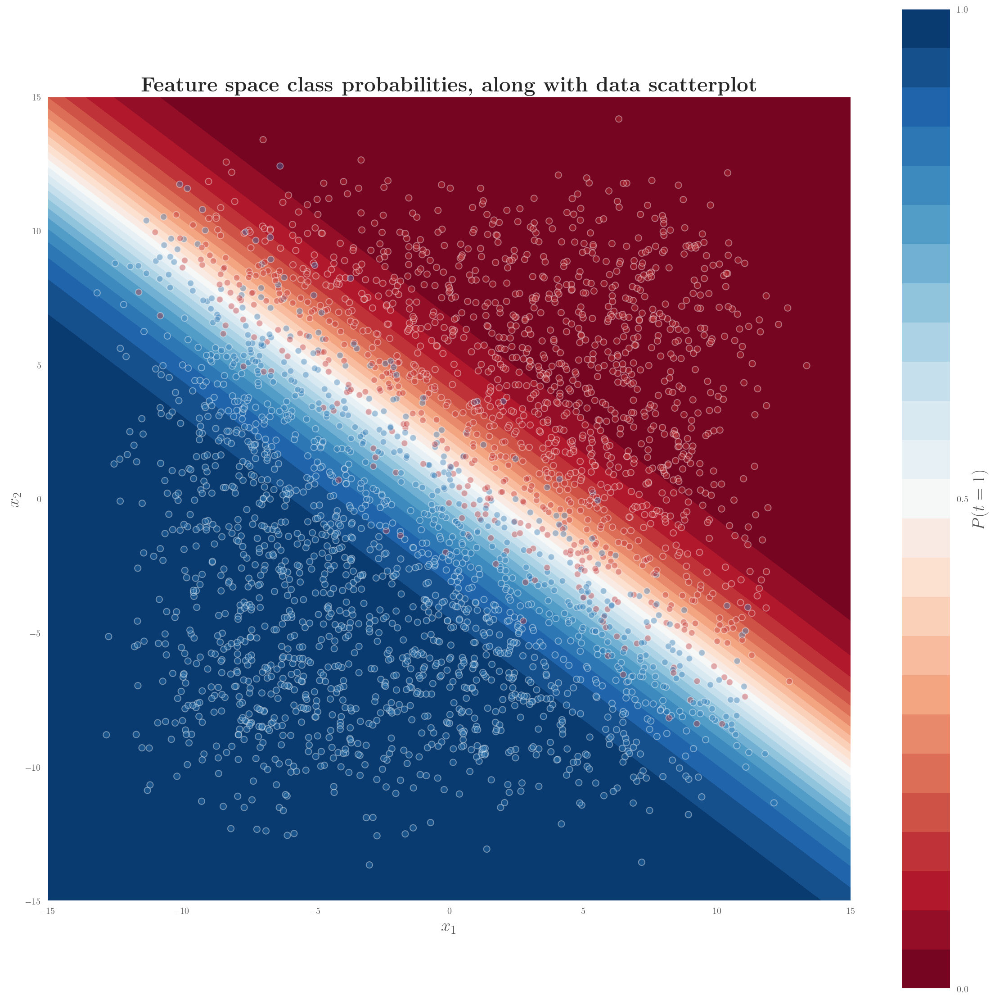

In [92]:
sample_x, sample_y = np.mgrid[-15:15:.01, -15:15:.01]
grid = np.c_[sample_x.ravel(), sample_y.ravel()]

probsLDA = lda.predict_proba(grid)[:, 1].reshape(sample_x.shape)

# Now let us draw the decision-boundary
figure, axes = plt.subplots(figsize=(20,20))
contour = axes.contourf (sample_x, 
                         sample_y, 
                         probsLDA, 
                         25, 
                         cmap="RdBu",
                         vmin=0,
                         vmax=1)
axes_color = figure.colorbar(contour)
axes_color.set_label("$P(t=1)$")
axes_color.set_ticks ([0.0, 0.5, 1.0])

# Draw the scatterplot
axes.scatter(X['x1'], 
             X['x2'], 
             c=data.t, 
             s=50, 
             cmap="RdBu", 
             vmin=-0.2, 
             vmax=1.2, 
             edgecolor="white", 
             linewidth=1,
             alpha=0.4)

#Labels, etc.
axes.set(aspect="equal", 
         xlim=(-15,15),
         ylim=(-15,15),
         xlabel="$x_1$",
         ylabel="$x_2$"
        )

plt.title(r'\textbf{Feature space class probabilities, along with data scatterplot}');

